In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import redun
import seaborn as sns
import scanpy as sc
import anndata

import torch
import matplotlib.pyplot as plt
import matplotlib.colors as colors


from collections import defaultdict

from sams_vae.data.utils.anndata import align_adatas

from sams_vae.models.utils.perturbation_lightning_module import TrainConfigPerturbationLightningModule
from sams_vae.models import SAMSVAEModel, CPAVAEModel, SVAEPlusModel, ConditionalVAEModel
from sams_vae.models import SAMSVAEMeanFieldNormalGuide, SAMSVAECorrelatedNormalGuide, CPAVAENormalGuide, SVAEPlusGuide, ConditionalVAEGuide

### Before running

Run `3_aggregate_results.py` and `4_download_checkpoints.py` to generate or download metrics and checkpoints. See README for more info.

## Tables

In [3]:
results = pd.read_csv("results/replogle_results.csv")

We focus on `mask_prior_prob=0.001` for the SAMS-VAE models because 1) we are interested in sparse models and 2) we find that val/IWELBO is similar across different priors.

In [4]:
# compare SAMS-VAE results with different mask prior probabilities
results[(results["n_latent"] == 100) & results["model"].apply(lambda x: "sams_vae" in x)]\
        .groupby(["n_latent", "model", "guide", "mask_prior_prob", "mean_field_encoder"], dropna=False)\
        [["val/IWELBO", "test/IWELBO", "val/frac_mask_freq_geq_0.5", "ATE_pearsonr-all", "ATE_pearsonr_top20-all", "ATE_r2-all"]]\
        .agg(["mean", "std"])

val/IWELBO  \
                                                                                                      mean   
n_latent model                guide                        mask_prior_prob mean_field_encoder                
100      sams_vae_correlated" SAMSVAECorrelatedNormalGuide 0.001           False              -1758.339502   
                                                                           True               -1760.096045   
                                                           0.010           False              -1758.280884   
                                                                           True               -1759.967920   
                                                           0.100           False              -1758.157251   
                                                                           True               -1760.101514   
         sams_vae_mean_field  SAMSVAEMeanFieldNormalGuide  0.001           False              -1758.503833   
                                                                           True               -1759.795068   
                                                           0.010           False              -1758.359375   
                                                                           True               -1759.936719   
                                                           0.100           False              -1758.362036   
                                                                           True               -1760.145703   

                                                                                                         \
                                                                                                    std   
n_latent model                guide                        mask_prior_prob mean_field_encoder             
100      sams_vae_correlated" SAMSVAECorrelatedNormalGuide 0.001           False               0.069345   
                                                                           True                0.039393   
                                                           0.010           False               0.067796   
                                                                           True                0.074665   
                                                           0.100           False               0.059375   
                                                                           True                0.065851   
         sams_vae_mean_field  SAMSVAEMeanFieldNormalGuide  0.001           False               0.041484   
                                                                           True                0.111441   
                                                           0.010           False               0.069782   
                                                                           True                0.151991   
                                                           0.100           False               0.043239   
                                                                           True                0.095724   

                                                                                               test/IWELBO  \
                                                                                                      mean   
n_latent model                guide                        mask_prior_prob mean_field_encoder                
100      sams_vae_correlated" SAMSVAECorrelatedNormalGuide 0.001           False              -1756.267065   
                                                                           True               -1758.080444   
                                                           0.010           False              -1756.218408   
                                                                           True               -1757.906470   
                                                           0.100     

In [5]:
# focus on mask_prior_prob=0.001 for SAMS-VAE models in further analysis
results = results[results["mask_prior_prob"].apply(lambda x: (x == 0.001) or pd.isna(x))]

In [6]:
results[results["n_latent"] == 100]\
        .groupby(["n_latent", "model", "guide", "mask_prior_prob", "mask_beta_concentration_2", "mean_field_encoder"], dropna=False)\
        [["val/IWELBO", "test/IWELBO", "ATE_pearsonr-all", "ATE_pearsonr_top20-all"]]\
        .agg(["mean", "std"])\
        .sort_values(("val/IWELBO", "mean"), ascending=False)\
        .reset_index().drop_duplicates([("model",""), ("guide",""), ("mean_field_encoder", "")])

n_latent                 model                         guide  \
                                                                 
0      100  sams_vae_correlated"  SAMSVAECorrelatedNormalGuide   
1      100   sams_vae_mean_field   SAMSVAEMeanFieldNormalGuide   
2      100               cpa_vae             CPAVAENormalGuide   
3      100   sams_vae_mean_field   SAMSVAEMeanFieldNormalGuide   
4      100  sams_vae_correlated"  SAMSVAECorrelatedNormalGuide   
5      100               cpa_vae             CPAVAENormalGuide   
6      100                 svae+                 SVAEPlusGuide   
9      100       conditional_vae           ConditionalVAEGuide   

  mask_prior_prob mask_beta_concentration_2 mean_field_encoder   val/IWELBO  \
                                                                       mean   
0           0.001                       NaN              False -1758.339502   
1           0.001                       NaN              False -1758.503833   
2             NaN                       NaN              False -1758.666309   
3           0.001                       NaN               True -1759.795068   
4           0.001                       NaN               True -1760.096045   
5             NaN                       NaN               True -1762.263647   
6             NaN                       2.0                NaN -1763.492871   
9             NaN                       NaN                NaN -1768.234570   

             test/IWELBO           ATE_pearsonr-all            \
        std         mean       std             mean       std   
0  0.069345 -1756.267065  0.104802         0.732879  0.031782   
1  0.041484 -1756.405835  0.056069         0.724837  0.016825   
2  0.139840 -1756.571997  0.139090         0.568635  0.005247   
3  0.111441 -1757.721680  0.131419         0.265033  0.026980   
4  0.039393 -1758.080444  0.071922         0.284891  0.014998   
5  0.204368 -1760.141772  0.198272         0.487956  0.018799   
6  0.049198 -1761.415796  0.055619         0.607322  0.017061   
9  0.185733 -1766.097534  0.171559         0.753579  0.005399   

  ATE_pearsonr_top20-all            
                    mean       std  
0               0.878029  0.012114  
1               0.872875  0.008324  
2               0.861607  0.002908  
3               0.474602  0.024532  
4               0.490374  0.011717  
5               0.715433  0.023088  
6               0.825149  0.005963  
9               0.920004  0.003091

In [7]:
results[results["n_latent"] == 200]\
        .groupby(["n_latent", "model", "guide", "mask_prior_prob", "mask_beta_concentration_2", "mean_field_encoder"], dropna=False)\
        [["val/IWELBO", "test/IWELBO", "ATE_pearsonr-all", "ATE_pearsonr_top20-all", "ATE_r2-all"]]\
        .agg(["mean", "std"])\
        .sort_values(("val/IWELBO", "mean"), ascending=False)\
        .reset_index().drop_duplicates([("model",""), ("guide",""), ("mean_field_encoder", "")])

n_latent                 model                         guide  \
                                                                 
0      200   sams_vae_mean_field   SAMSVAEMeanFieldNormalGuide   
1      200  sams_vae_correlated"  SAMSVAECorrelatedNormalGuide   
2      200               cpa_vae             CPAVAENormalGuide   
3      200   sams_vae_mean_field   SAMSVAEMeanFieldNormalGuide   
4      200  sams_vae_correlated"  SAMSVAECorrelatedNormalGuide   
5      200               cpa_vae             CPAVAENormalGuide   
6      200                 svae+                 SVAEPlusGuide   
9      200       conditional_vae           ConditionalVAEGuide   

  mask_prior_prob mask_beta_concentration_2 mean_field_encoder   val/IWELBO  \
                                                                       mean   
0           0.001                       NaN              False -1758.157349   
1           0.001                       NaN              False -1758.430249   
2             NaN                       NaN              False -1759.258936   
3           0.001                       NaN               True -1759.617944   
4           0.001                       NaN               True -1760.063159   
5             NaN                       NaN               True -1762.984839   
6             NaN                       2.0                NaN -1763.341626   
9             NaN                       NaN                NaN -1768.101196   

             test/IWELBO           ATE_pearsonr-all            \
        std         mean       std             mean       std   
0  0.087306 -1756.087231  0.090388         0.738620  0.008213   
1  0.117017 -1756.408057  0.115061         0.730302  0.034886   
2  0.331005 -1757.169653  0.343087         0.544836  0.026744   
3  0.085414 -1757.568262  0.087773         0.279900  0.024487   
4  0.204263 -1757.986865  0.198906         0.288217  0.018135   
5  0.283205 -1760.881812  0.292336         0.498993  0.020325   
6  0.254099 -1761.248340  0.221965         0.626412  0.023223   
9  0.199511 -1765.948560  0.190062         0.756022  0.006545   

  ATE_pearsonr_top20-all           ATE_r2-all            
                    mean       std       mean       std  
0               0.879934  0.004415   0.518160  0.008803  
1               0.882324  0.014294   0.508704  0.037450  
2               0.848820  0.010920   0.190637  0.051311  
3               0.487781  0.018780   0.065263  0.008297  
4               0.510121  0.011398   0.070273  0.006689  
5               0.733640  0.011868   0.208989  0.011810  
6               0.835492  0.007797   0.386582  0.026903  
9               0.922140  0.004708   0.561753  0.009457

## Replogle figures

### Load lightning modules

In [8]:
def load_checkpoint(checkpoint_path: str):
    lightning_module = TrainConfigPerturbationLightningModule.load_from_checkpoint(
        checkpoint_path, map_location="cpu",
    )
    return lightning_module

In [9]:
checkpoint_paths = redun.file.glob.glob("results/checkpoints/*/checkpoints/*.ckpt", recursive=True)

In [10]:
ls results/checkpoints/balmy-sweep-2/checkpoints/

best-epoch=207-step=30992-val_loss=1772.71.ckpt


In [11]:
lightning_modules = [load_checkpoint(checkpoint_paths[i]) for i in range(len(checkpoint_paths))]

In [12]:
for lightning_module in lightning_modules:
    mf = lightning_module.config["guide_kwargs"].get("mean_field_encoder", "NA")
    print(lightning_module.config["data_module"], lightning_module.config["model"], lightning_module.config["guide"], "mean field: ", mf)

ReplogleDataModule SAMSVAEModel SAMSVAEMeanFieldNormalGuide mean field:  True
ReplogleDataModule CPAVAEModel CPAVAENormalGuide mean field:  False
ReplogleDataModule SAMSVAEModel SAMSVAEMeanFieldNormalGuide mean field:  False
ReplogleDataModule SAMSVAEModel SAMSVAEMeanFieldNormalGuide mean field:  True
ReplogleDataModule SAMSVAEModel SAMSVAECorrelatedNormalGuide mean field:  True
ReplogleDataModule CPAVAEModel CPAVAENormalGuide mean field:  True
ReplogleDataModule SVAEPlusModel SVAEPlusGuide mean field:  NA
ReplogleDataModule SAMSVAEModel SAMSVAEMeanFieldNormalGuide mean field:  False
ReplogleDataModule SAMSVAEModel SAMSVAEMeanFieldNormalGuide mean field:  True
ReplogleDataModule SAMSVAEModel SAMSVAEMeanFieldNormalGuide mean field:  False
ReplogleDataModule SAMSVAEModel SAMSVAECorrelatedNormalGuide mean field:  False
ReplogleDataModule ConditionalVAEModel ConditionalVAEGuide mean field:  NA
ReplogleDataModule SAMSVAEModel SAMSVAECorrelatedNormalGuide mean field:  False
ReplogleDataModul

In [13]:
def get_name_from_config(config):
    if config["model"] == "SAMSVAEModel":
        name = "sams_vae"
    elif config["model"] == "CPAVAEModel":
        name = "cpa_vae"
    elif config["model"] == "SVAEPlusModel":
        name = "svae_plus"
    else:
        name = "conditional_vae"
        
    if "MeanField" in config["guide"]:
        name += "_mean_field_embedding"
        
    mf = lightning_module.config["guide_kwargs"].get("mean_field_encoder", "NA")
    if mf == True:
        name += "_mean_field_encoder"
    return name

In [14]:
lightning_module_dict = {}
for lightning_module in lightning_modules:
    name = get_name_from_config(lightning_module.config)
    mask_prior_prob = lightning_module.config["model_kwargs"].get("mask_prior_prob")
    if (not pd.isna(mask_prior_prob)) and mask_prior_prob != 0.001:
        continue
    lightning_module_dict[name] = lightning_module
    print(name, mask_prior_prob)

sams_vae_mean_field_embedding_mean_field_encoder 0.001
cpa_vae None
sams_vae_mean_field_embedding 0.001
cpa_vae_mean_field_encoder None
svae_plus None
conditional_vae None
sams_vae 0.001
sams_vae_mean_field_encoder 0.001


### Extract perturbation latent variables

In [15]:
def get_latent_vars(lightning_module):
    latent_vars = {}
    
    model = lightning_module.loss_module.model
    guide = lightning_module.loss_module.guide
    
    torch.manual_seed(0)
    with torch.no_grad():
        guide_dists, guide_samples = lightning_module.loss_module.guide(n_particles=100)
    
    if type(guide) == SAMSVAECorrelatedNormalGuide:
        latent_vars["mask_probs"] = guide_dists["q_mask"].probs.detach().cpu().squeeze().numpy()
        latent_vars["E_mean"] = guide_dists["q_E"].mean.mean(0).detach().cpu().squeeze().numpy()
    if type(guide) == SAMSVAEMeanFieldNormalGuide:
        latent_vars["mask_probs"] = guide_dists["q_mask"].probs.detach().cpu().squeeze().numpy()
        latent_vars["E_mean"] = guide_dists["q_E"].mean.detach().cpu().squeeze().numpy()
    elif type(guide) == CPAVAENormalGuide:
        latent_vars["mask_probs"] = None
        latent_vars["E_mean"] = guide_dists["q_E"].mean.detach().cpu().squeeze().numpy()
    elif type(guide) == SVAEPlusGuide:
        latent_vars["mask_probs"] = guide_dists["q_mask_prob"].v.detach().cpu().squeeze().numpy()
        latent_vars["E_mean"] = lightning_module.loss_module.model.action_prior_mean.detach().cpu().squeeze().numpy()
    elif type(guide) == ConditionalVAEGuide:
        latent_vars["mask_probs"] = None
        latent_vars["E_mean"] = None
        
    return latent_vars

In [16]:
latent_var_dict = {name: get_latent_vars(lm) for name, lm in lightning_module_dict.items()}

In [17]:
latent_var_dict.keys()

dict_keys(['sams_vae_mean_field_embedding_mean_field_encoder', 'cpa_vae', 'sams_vae_mean_field_embedding', 'cpa_vae_mean_field_encoder', 'svae_plus', 'conditional_vae', 'sams_vae', 'sams_vae_mean_field_encoder'])

### Plot perturbation latent variables

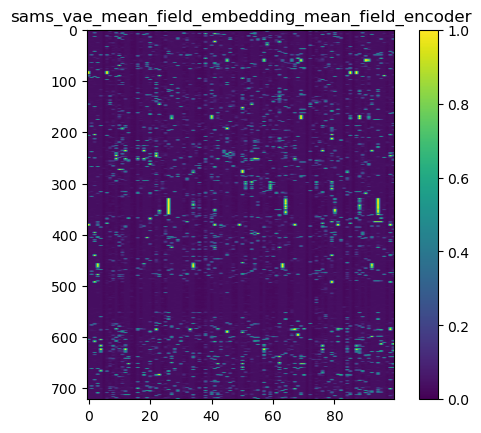

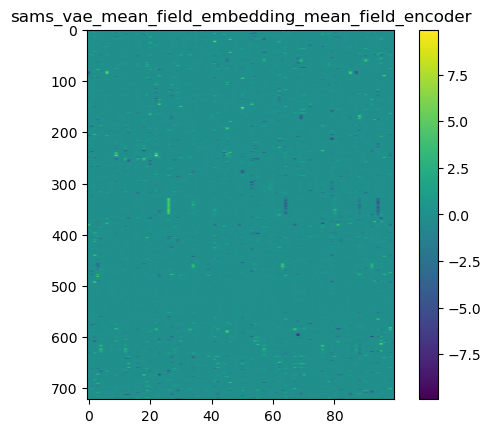

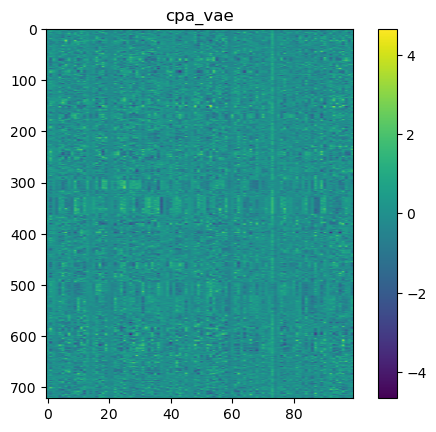

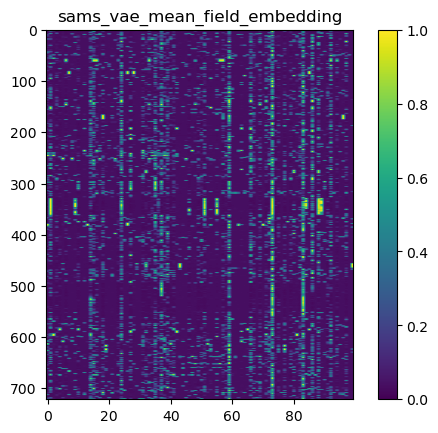

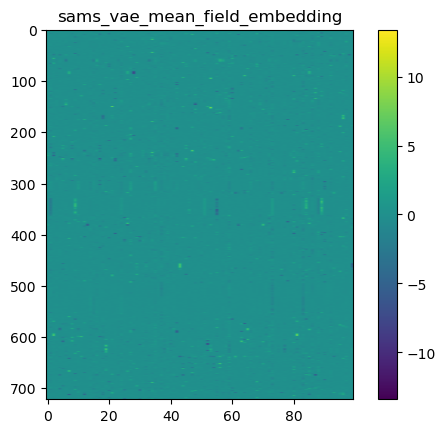

...

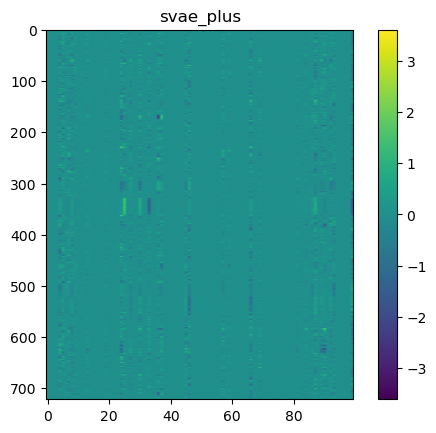

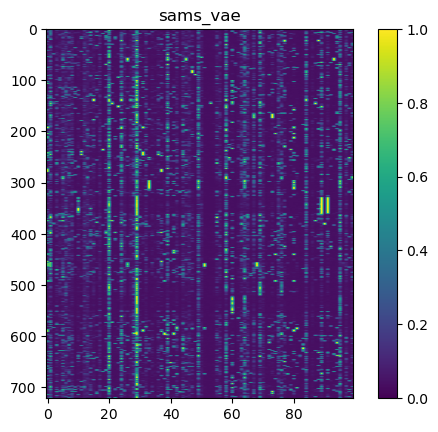

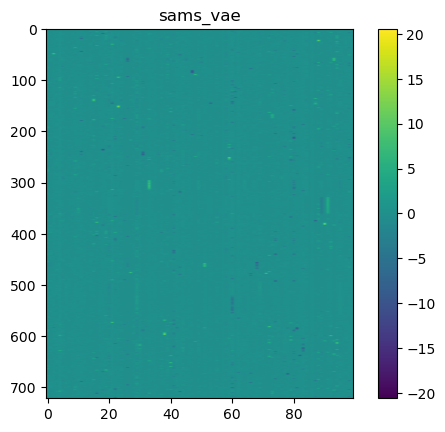

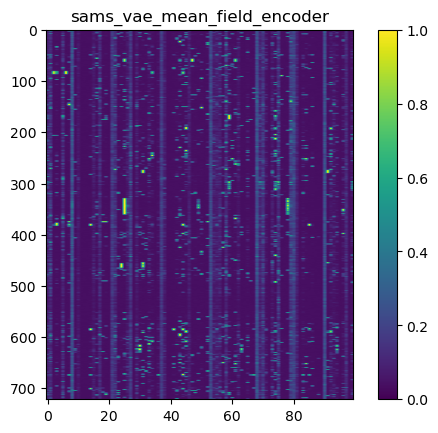

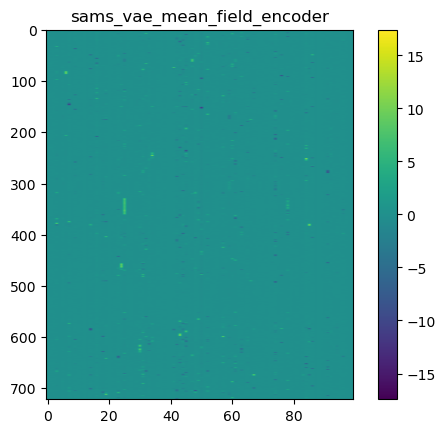

In [18]:
for k in latent_var_dict:
    mask_probs = latent_var_dict[k]["mask_probs"]
    E_mean = latent_var_dict[k]["E_mean"]
    
    if mask_probs is not None:
        plt.title(k)
        plt.imshow(mask_probs, vmin=0, vmax=1, aspect=1/6)
        plt.colorbar()
        plt.show(plt.gcf())
        plt.close()
        
    if E_mean is not None:
        plt.title(k)
        plt.imshow(E_mean, aspect=1/6, norm=colors.CenteredNorm())
        plt.colorbar()
        plt.show(plt.gcf())
        plt.close()

### Plot perturbation latent variables sorted by annotated pathway

Pathway annotations were not used while training models. Additionally, not all perturbations have annotations

In [19]:
data_module = lightning_modules[0].get_data_module()

In [20]:
# annotate treatments with pathways from Replogle et al.
t_var = data_module.get_d_var_info().copy()

t_var["i"] = np.arange(t_var.shape[0])
t_var["gene"] = [idx.split("_")[0] for idx in t_var.index]

pathway_map = {}
for k, v in data_module.adata.uns["pathways"].items():
    for gene in v:
        pathway_map[gene] = k
        
t_var["pathway"] = t_var["gene"].apply(lambda x: pathway_map.get(x))

t_var["pathway"].value_counts(dropna=False)

pathway
None                          377
S40_RIBOSOMAL_UNIT            101
S60_RIBOSOMAL_UNIT             56
S39_RIBOSOMAL_UNIT             44
SPLICEOSOME                    38
MT_PROTEIN_TRANSLOCATION       37
MEDIATOR_COMPLEX               26
NUCLEOTIDE_EXCISION_REPAIR     23
EXOSOME                        20
Name: count, dtype: int64

In [21]:
# info to sort embeddings by pathway
sorted_pathways = t_var.dropna(subset=["pathway"]).sort_values(["pathway", "gene"])
sorted_pathways["j"] = np.arange(sorted_pathways.shape[0])
idx = sorted_pathways["i"].to_numpy()
pathway_divisions = sorted_pathways.dropna(subset=["pathway"]).sort_values(["pathway", "gene"]).drop_duplicates("pathway")

In [22]:
pathway_divisions

cell_barcode,i,gene,pathway,j
CAMTA2_-_4890571.23-P1P2|CAMTA2_-_4890543.23-P1P2,48,CAMTA2,EXOSOME,0
ADAM10_+_59041886.23-P1P2|ADAM10_-_59041703.23-P1P2,11,ADAM10,MEDIATOR_COMPLEX,20
AARS_+_70323362.23-P1P2|AARS_-_70323332.23-P1P2,2,AARS,MT_PROTEIN_TRANSLOCATION,46
C1QBP_-_5342366.23-P1P2|C1QBP_-_5342105.23-P1P2,43,C1QBP,NUCLEOTIDE_EXCISION_REPAIR,83
AARS2_+_44281027.23-P1P2|AARS2_+_44281044.23-P1P2,1,AARS2,S39_RIBOSOMAL_UNIT,106
AAR2_-_34824434.23-P1P2|AAR2_+_34824488.23-P1P2,0,AAR2,S40_RIBOSOMAL_UNIT,150
ABCF1_+_30539238.23-P1|ABCF1_+_30539469.23-P1,4,ABCF1,S60_RIBOSOMAL_UNIT,251
CLNS1A_-_77348773.23-P1P2|CLNS1A_-_77348782.23-P1P2,76,CLNS1A,SPLICEOSOME,307


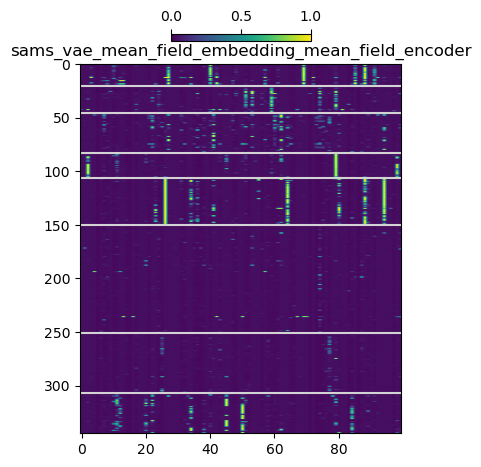

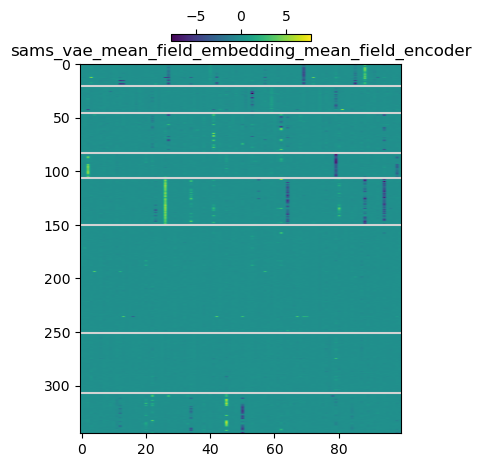

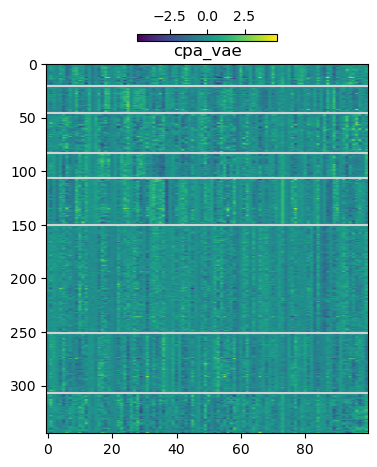

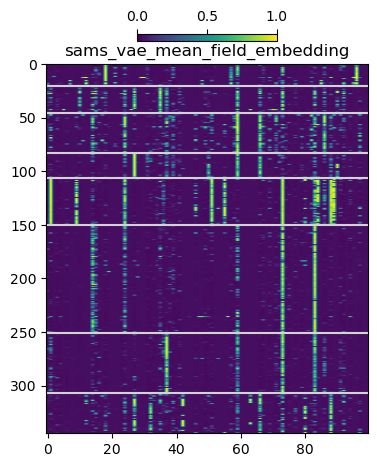

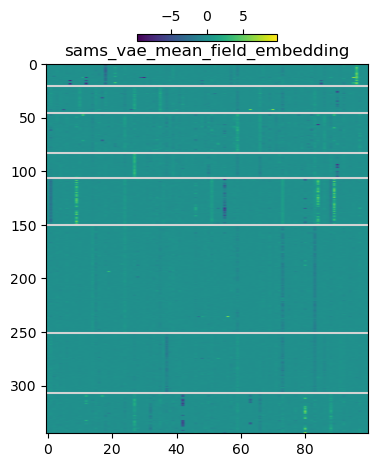

...

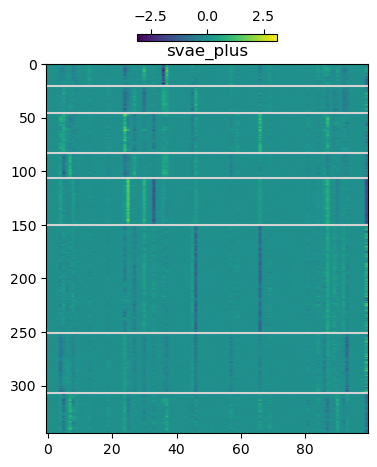

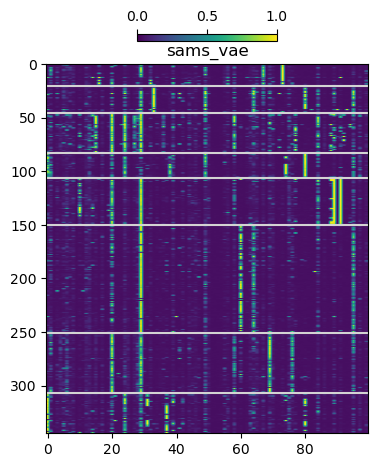

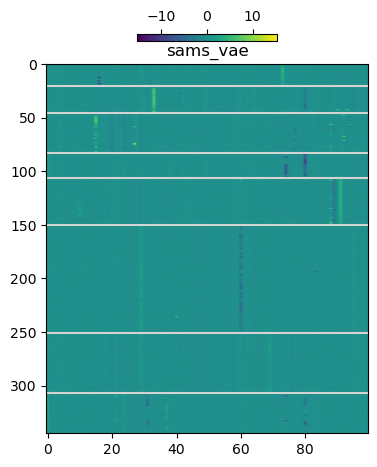

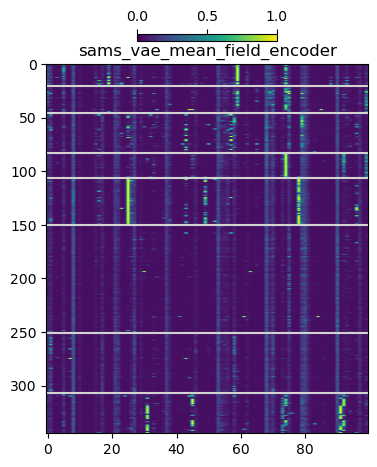

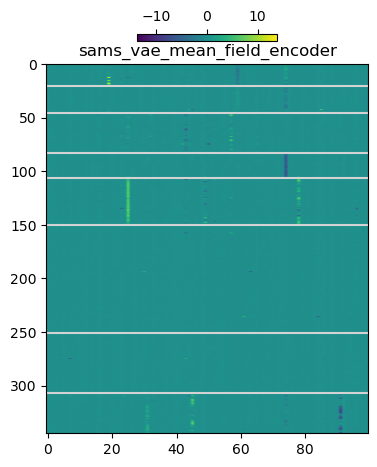

In [23]:
for k in latent_var_dict:
    mask_probs = latent_var_dict[k]["mask_probs"]
    E_mean = latent_var_dict[k]["E_mean"]
    
    if mask_probs is not None:
        plt.figure(figsize=(6,6))
        plt.title(k)
        plt.imshow(mask_probs[idx], vmin=0, vmax=1, aspect=1/3)
        for j in pathway_divisions["j"]:
            if j == 0:
                continue
            plt.axhline(y=j, c="lightgray")
        plt.colorbar(location="top", shrink=0.3)
        plt.show(plt.gcf())
        plt.close()
        
    if E_mean is not None:
        plt.figure(figsize=(6,6))
        plt.title(k)
        plt.imshow(E_mean[idx], aspect=1/3, norm=colors.CenteredNorm())
        for j in pathway_divisions["j"]:
            if j == 0:
                continue
            plt.axhline(y=j, c="lightgray")
        plt.colorbar(location="top", shrink=0.3)
        plt.show(plt.gcf())
        plt.close()

### Cluster perturbation latent variables

sams_vae_mean_field_embedding_mean_field_encoder


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


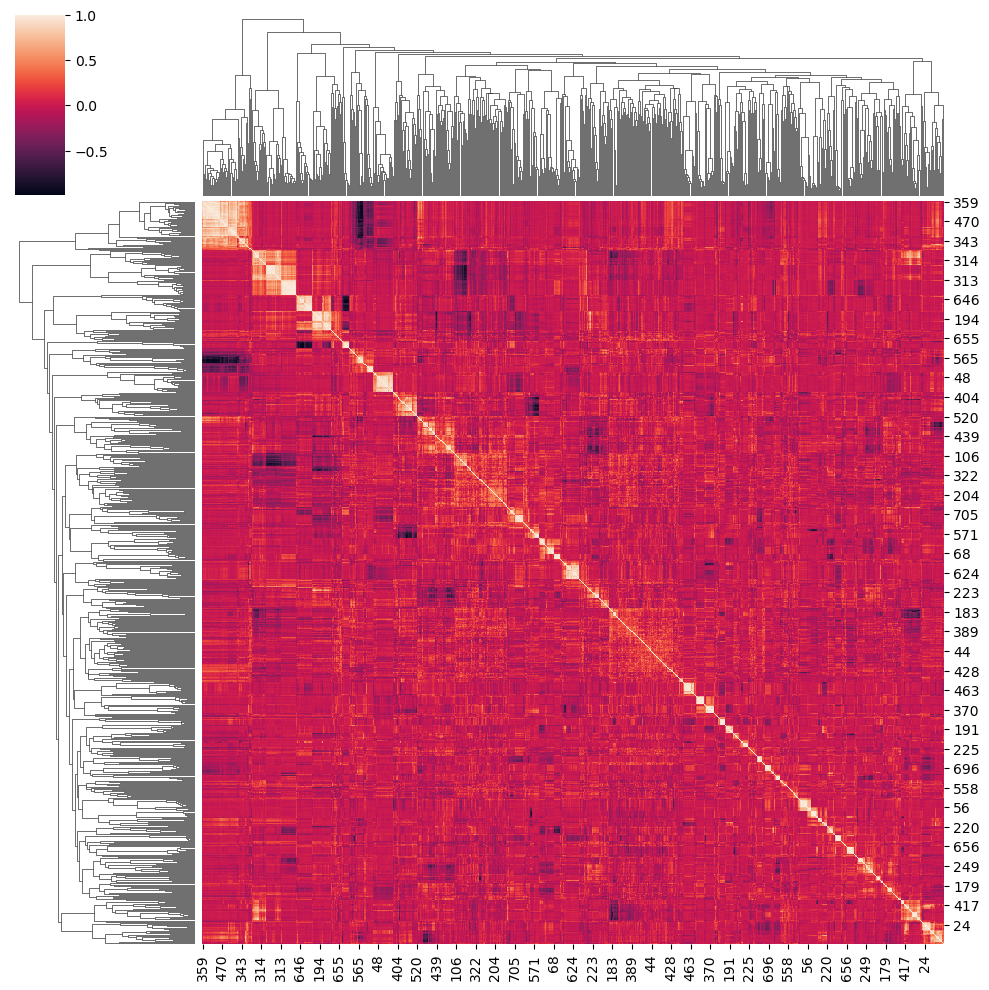

cpa_vae


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


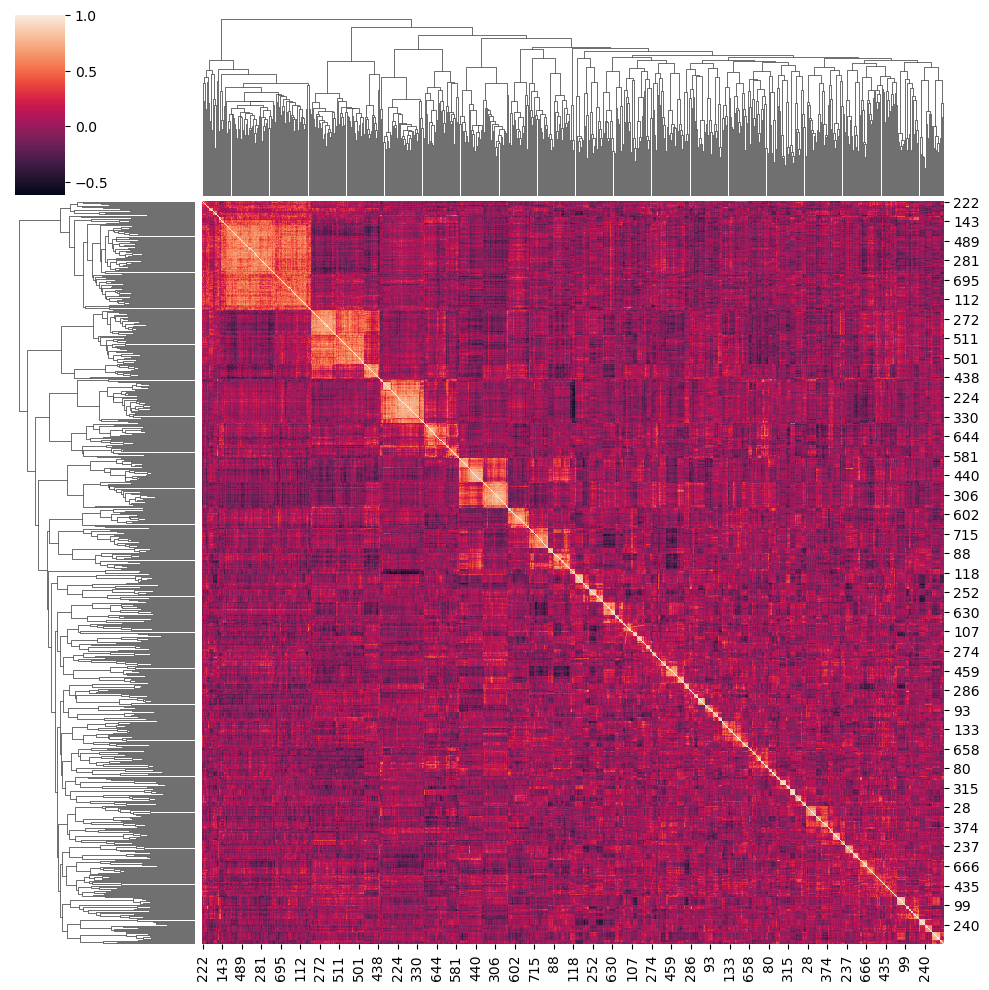

sams_vae_mean_field_embedding


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


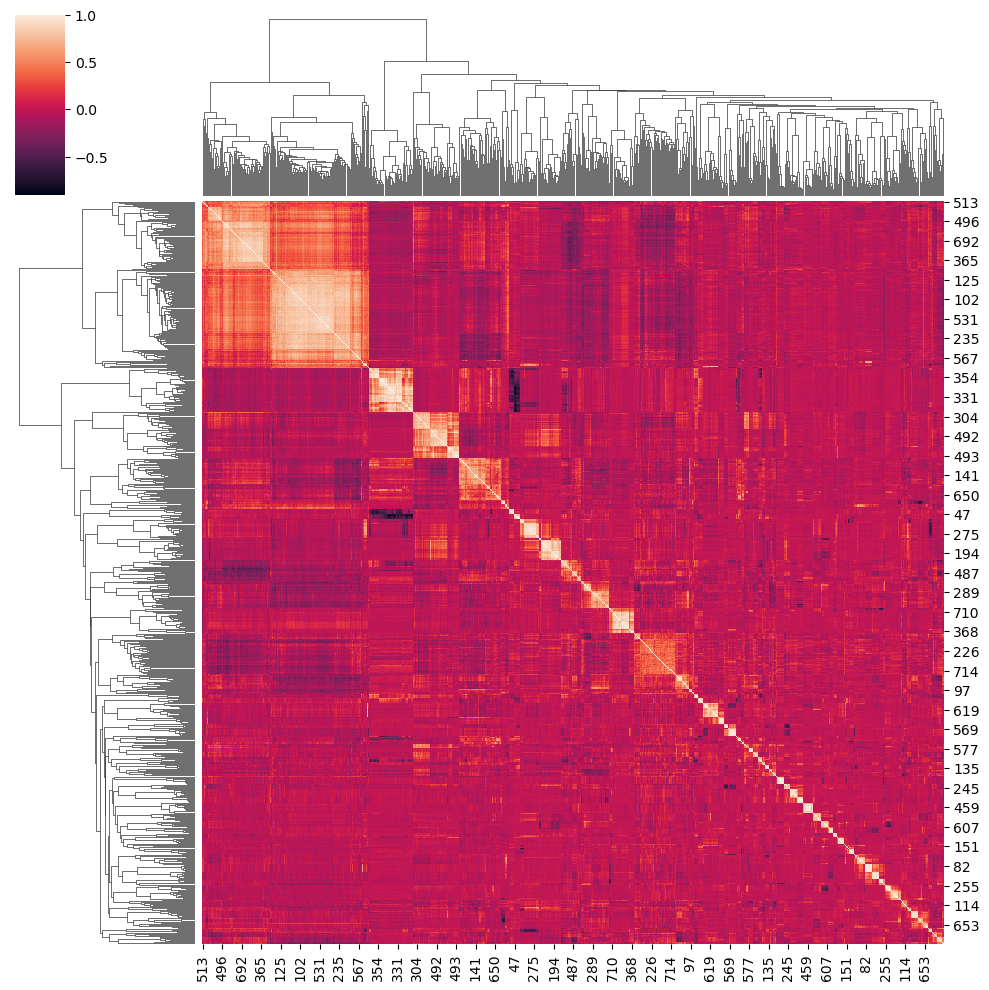

cpa_vae_mean_field_encoder


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


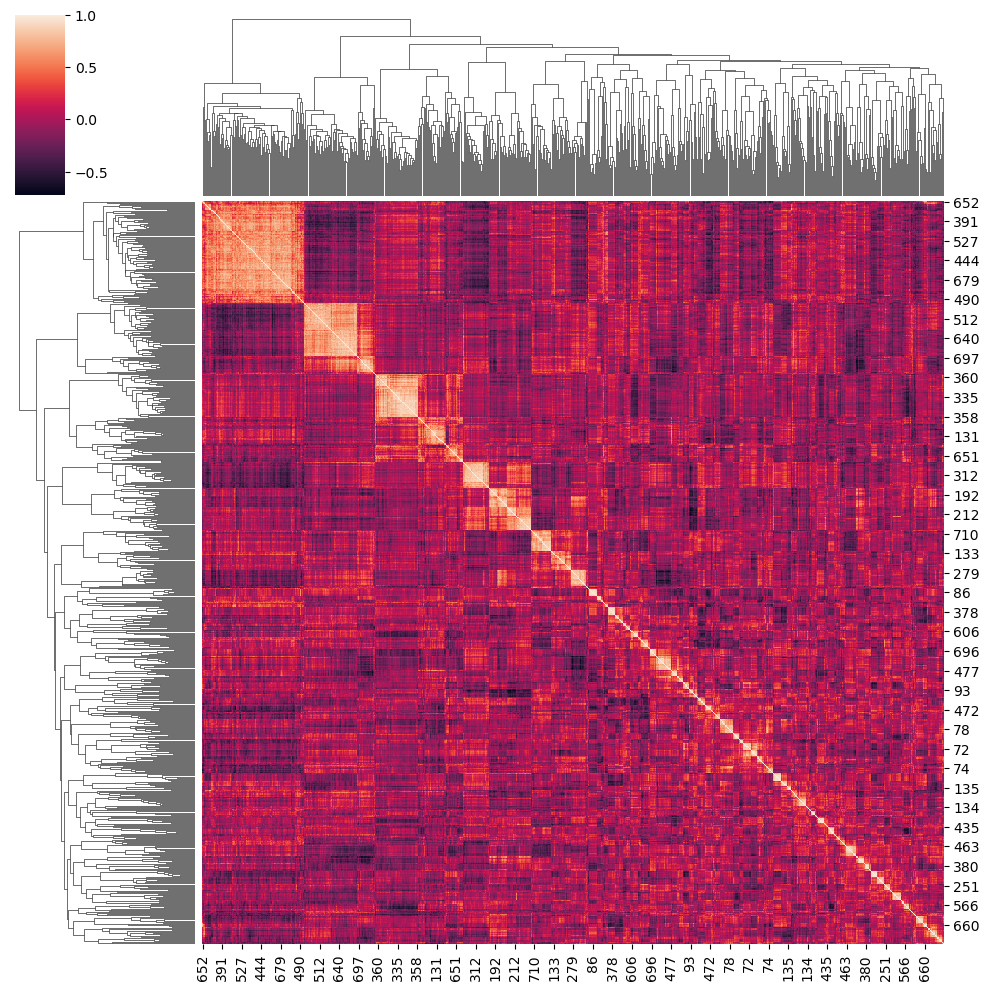

svae_plus


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


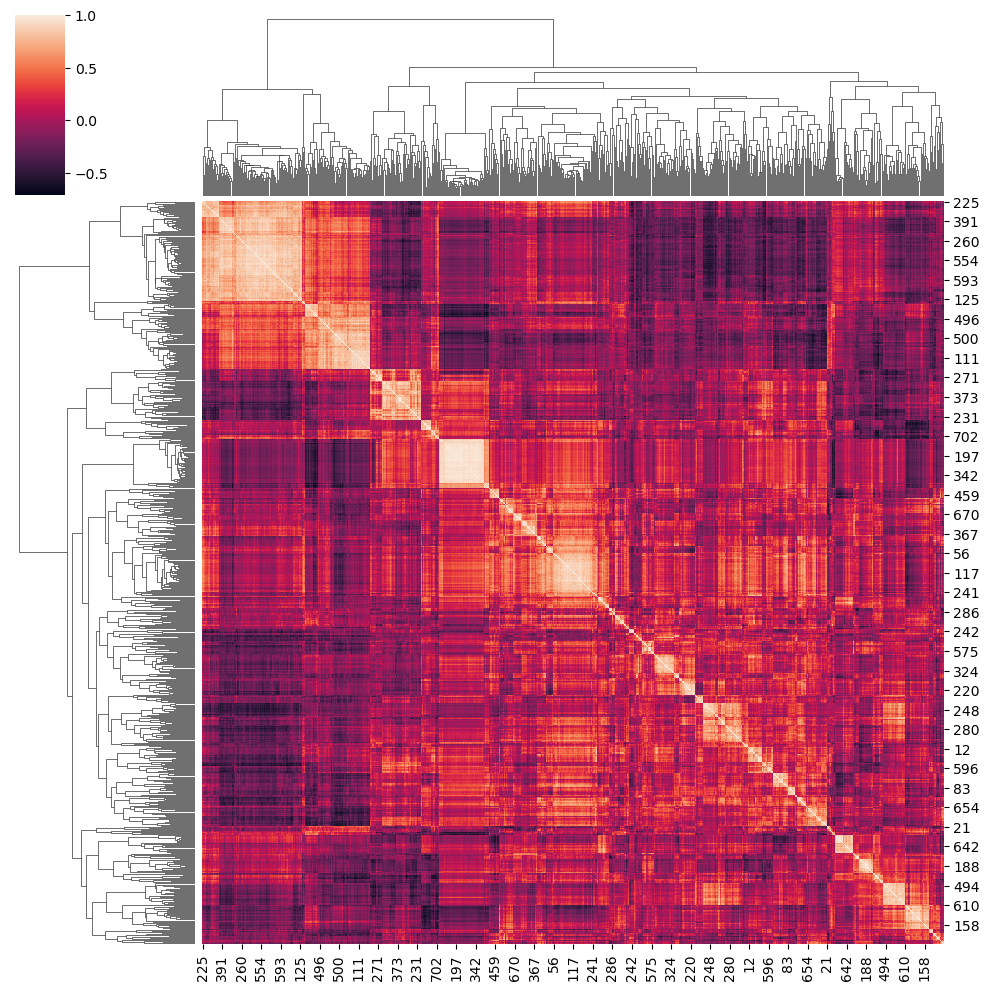

conditional_vae
sams_vae


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


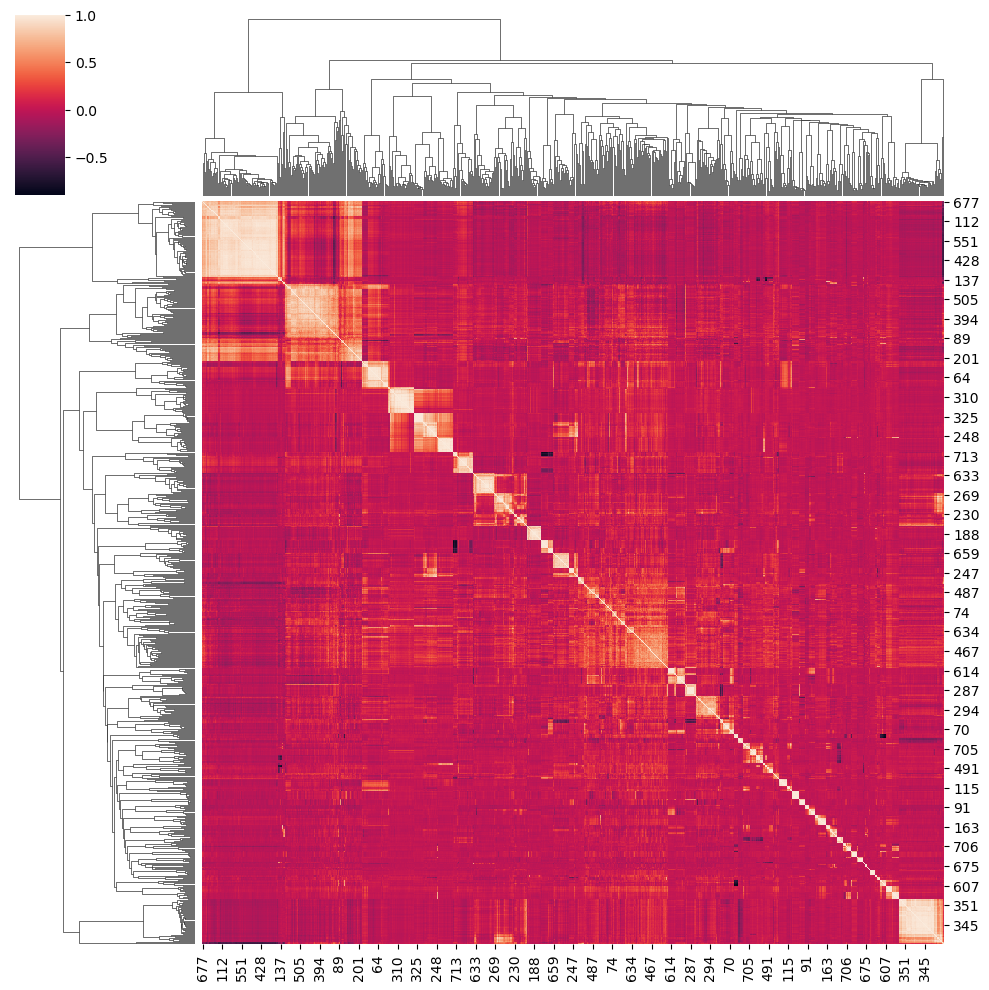

sams_vae_mean_field_encoder


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


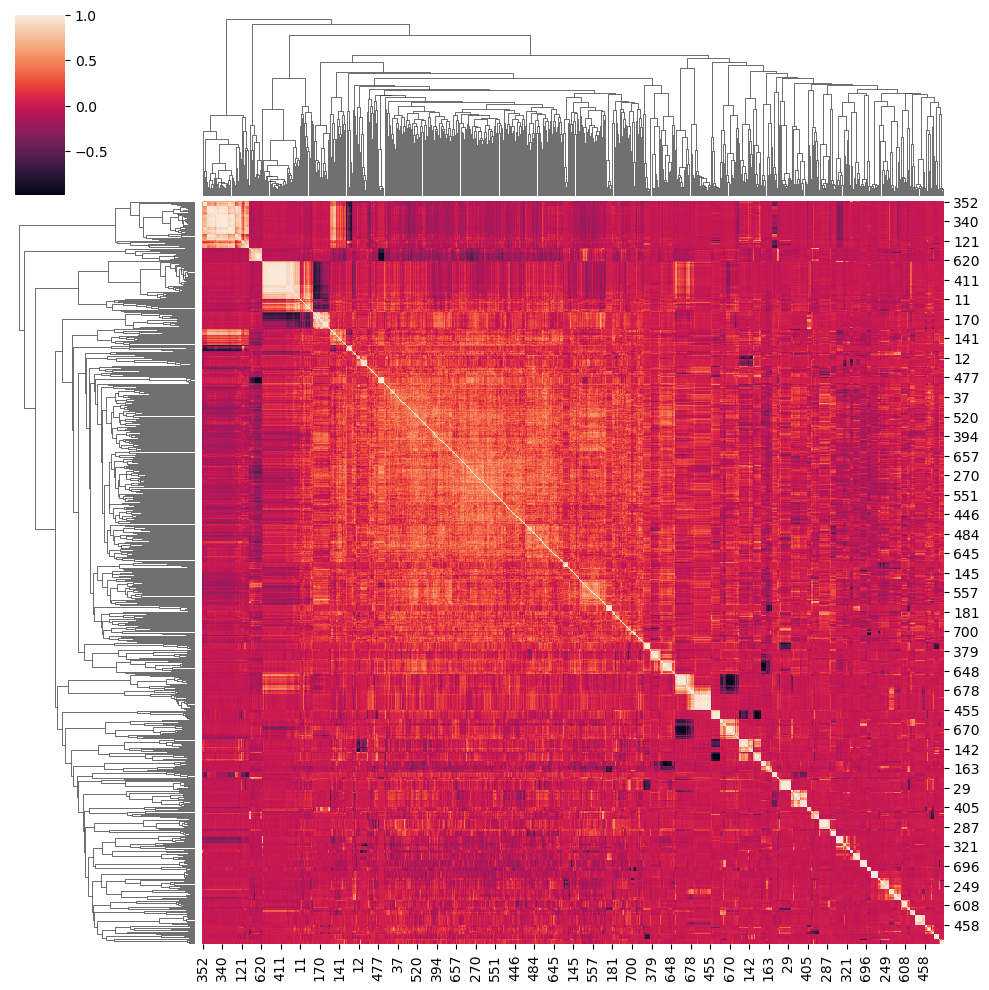

In [24]:
for k in latent_var_dict:
    print(k)
    if latent_var_dict[k]["E_mean"] is not None:
        sns.clustermap(np.corrcoef(latent_var_dict[k]["E_mean"]))
        plt.show(plt.gcf())
        plt.close()

### UMAP of perturbation latent variables, colored by annotated pathway

/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Figure size 500x500 with 0 Axes>

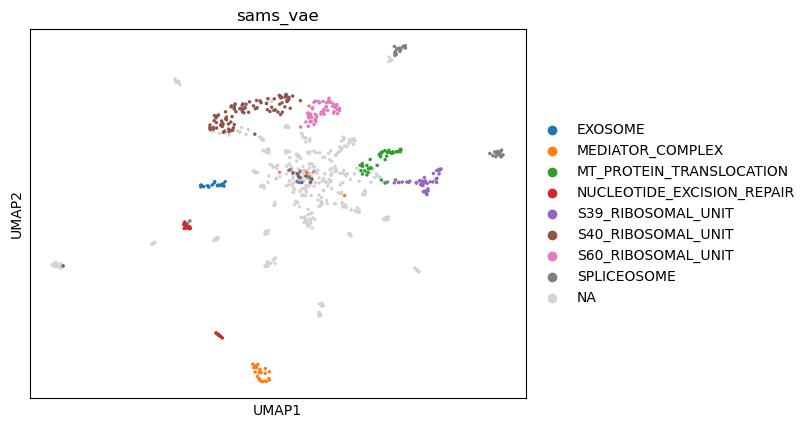

<Figure size 640x480 with 0 Axes>

/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Figure size 500x500 with 0 Axes>

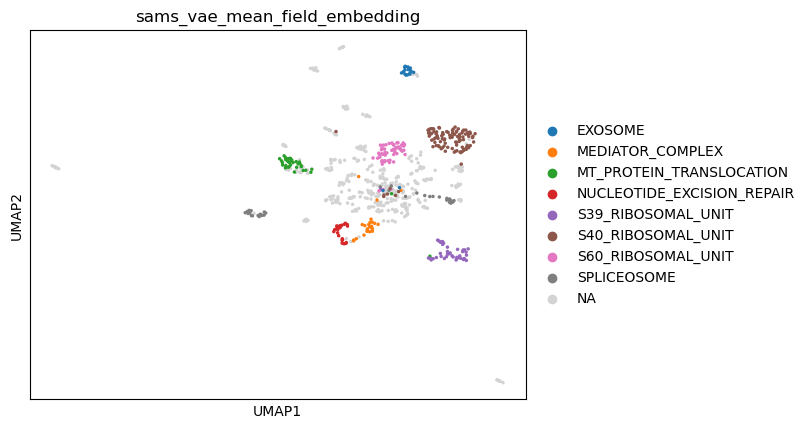

<Figure size 640x480 with 0 Axes>

/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Figure size 500x500 with 0 Axes>

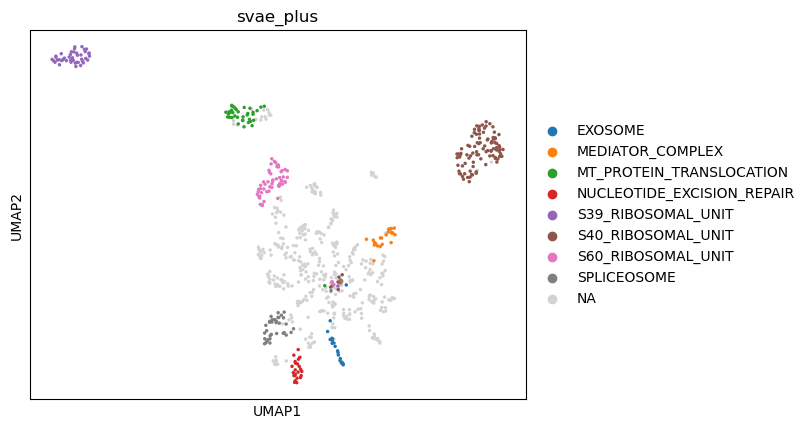

<Figure size 640x480 with 0 Axes>

/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Figure size 500x500 with 0 Axes>

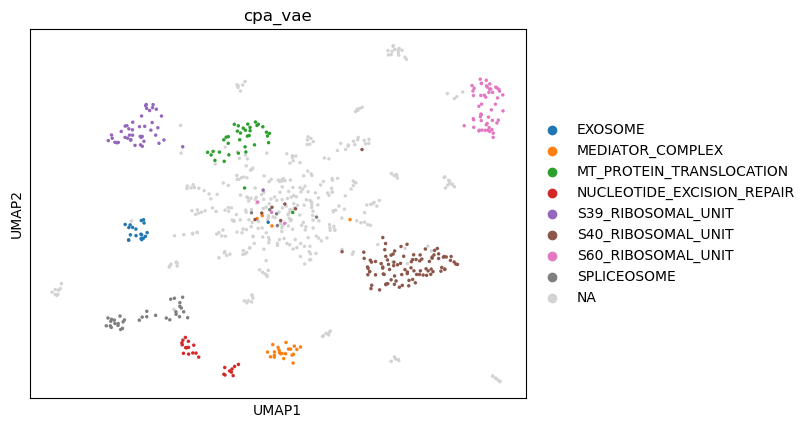

<Figure size 640x480 with 0 Axes>

In [29]:
# embeddings
for k in ["sams_vae", "sams_vae_mean_field_embedding", "svae_plus", "cpa_vae"]:
    if latent_var_dict[k]["E_mean"] is not None:
        embedding = latent_var_dict[k]["E_mean"]
        adata = anndata.AnnData(obs=t_var.copy(), X=embedding)
        sc.pp.pca(adata, n_comps=99)
        sc.pp.neighbors(adata, n_neighbors=10)
        sc.tl.umap(adata)
        plt.figure(figsize=(5,5))
        sc.pl.umap(adata, color=["pathway"], s=25, title=k)
        plt.show(plt.gcf())
        plt.close()

/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Figure size 500x500 with 0 Axes>

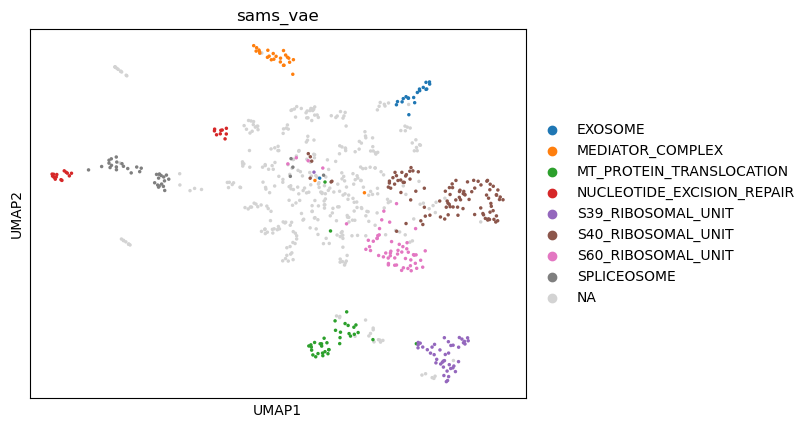

<Figure size 640x480 with 0 Axes>

/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Figure size 500x500 with 0 Axes>

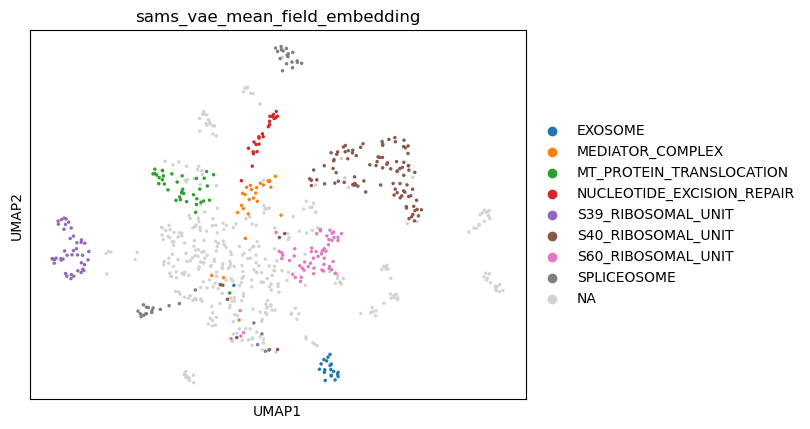

<Figure size 640x480 with 0 Axes>

/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Figure size 500x500 with 0 Axes>

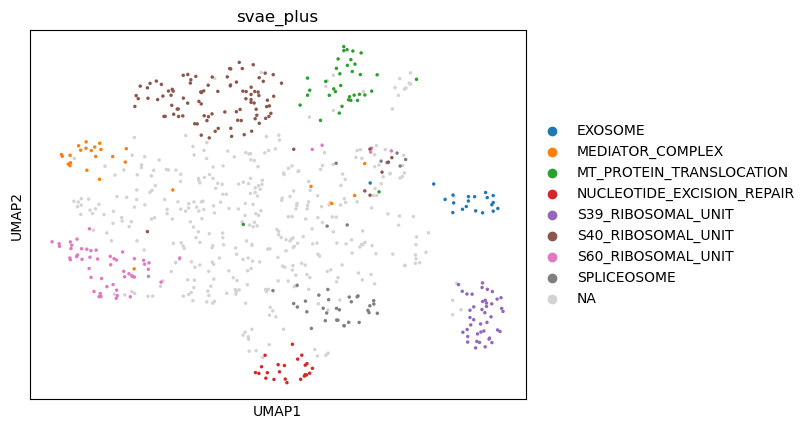

<Figure size 640x480 with 0 Axes>

In [30]:
# masks
for k in ["sams_vae", "sams_vae_mean_field_embedding", "svae_plus"]:
    if latent_var_dict[k]["E_mean"] is not None:
        mask_probs = latent_var_dict[k]["mask_probs"]
        adata = anndata.AnnData(obs=t_var.copy(), X=mask_probs)
        sc.pp.pca(adata, n_comps=99)
        sc.pp.neighbors(adata, n_neighbors=10)
        sc.tl.umap(adata)
        plt.figure(figsize=(5,5))
        sc.pl.umap(adata, color=["pathway"], s=25, title=k)
        plt.show(plt.gcf())
        plt.close()

### Predict pathway annotations from mask and embeddings

In [31]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split

In [32]:
def get_pathway_prediction_stats(X, t_var, n_splits=10):
    idx = (~pd.isna(t_var["pathway"])).to_numpy()
    X = X[idx]
    y_df = pd.get_dummies(t_var[idx]["pathway"])
    y = y_df.to_numpy().astype(np.float32)
    stats = defaultdict(list)
    for seed in range(n_splits):
        train_idx, val_idx = train_test_split(np.arange(y.shape[0]), test_size=0.3, random_state=seed)
        X_tr = X[train_idx]
        X_val = X[val_idx]
        y_tr = y[train_idx]
        y_val = y[val_idx]
        classifier = RandomForestClassifier(random_state=seed).fit(X_tr, y_tr)
        stats["split_seed"].append(seed)
        stats["acc_train"].append(classifier.score(X_tr, y_tr))
        stats["acc_val"].append(classifier.score(X_val, y_val))
    stats = pd.DataFrame(stats)
    return stats

In [33]:
mask_stats_list = []
for k in latent_var_dict:
    if latent_var_dict[k]["mask_probs"] is not None:
        mask = (latent_var_dict[k]["mask_probs"] > 0.5).astype(np.float32)
        mask_stats = get_pathway_prediction_stats(mask, t_var)
        mask_stats["model_key"] = k
        mask_stats_list.append(mask_stats)
mask_stats = pd.concat(mask_stats_list)

In [34]:
mask_stats.groupby("model_key").agg(["mean", "std", "count"])

split_seed                 \
                                                       mean      std count   
model_key                                                                    
sams_vae                                                4.5  3.02765    10   
sams_vae_mean_field_embedding                           4.5  3.02765    10   
sams_vae_mean_field_embedding_mean_field_encoder        4.5  3.02765    10   
sams_vae_mean_field_encoder                             4.5  3.02765    10   
svae_plus                                               4.5  3.02765    10   

                                                 acc_train                  \
                                                      mean       std count   
model_key                                                                    
sams_vae                                          0.962241  0.007688    10   
sams_vae_mean_field_embedding                     0.952282  0.010022    10   
sams_vae_mean_field_embedding_mean_field_encoder  0.733610  0.082172    10   
sams_vae_mean_field_encoder                       0.753942  0.018458    10   
svae_plus                                         0.973859  0.006790    10   

                                                   acc_val                  
                                                      mean       std count  
model_key                                                                   
sams_vae                                          0.889423  0.032765    10  
sams_vae_mean_field_embedding                     0.865385  0.026430    10  
sams_vae_mean_field_embedding_mean_field_encoder  0.677885  0.086152    10  
sams_vae_mean_field_encoder                       0.710577  0.035820    10  
svae_plus                                         0.775000  0.039045    10

In [35]:
embedding_stats_list = []
for k in latent_var_dict:
    if latent_var_dict[k]["E_mean"] is not None:
        embedding_stats = get_pathway_prediction_stats(latent_var_dict[k]["E_mean"], t_var)
        embedding_stats["model_key"] = k
        embedding_stats_list.append(embedding_stats)
embedding_stats_list = pd.concat(embedding_stats_list)

In [36]:
embedding_stats_list.groupby("model_key").agg(["mean", "std", "count"])

split_seed                 \
                                                       mean      std count   
model_key                                                                    
cpa_vae                                                 4.5  3.02765    10   
cpa_vae_mean_field_encoder                              4.5  3.02765    10   
sams_vae                                                4.5  3.02765    10   
sams_vae_mean_field_embedding                           4.5  3.02765    10   
sams_vae_mean_field_embedding_mean_field_encoder        4.5  3.02765    10   
sams_vae_mean_field_encoder                             4.5  3.02765    10   
svae_plus                                               4.5  3.02765    10   

                                                 acc_train             \
                                                      mean  std count   
model_key                                                               
cpa_vae                                                1.0  0.0    10   
cpa_vae_mean_field_encoder                             1.0  0.0    10   
sams_vae                                               1.0  0.0    10   
sams_vae_mean_field_embedding                          1.0  0.0    10   
sams_vae_mean_field_embedding_mean_field_encoder       1.0  0.0    10   
sams_vae_mean_field_encoder                            1.0  0.0    10   
svae_plus                                              1.0  0.0    10   

                                                   acc_val                  
                                                      mean       std count  
model_key                                                                   
cpa_vae                                           0.899038  0.027665    10  
cpa_vae_mean_field_encoder                        0.921154  0.020169    10  
sams_vae                                          0.852885  0.030759    10  
sams_vae_mean_field_embedding                     0.858654  0.034236    10  
sams_vae_mean_field_embedding_mean_field_encoder  0.628846  0.037978    10  
sams_vae_mean_field_encoder                       0.802885  0.046058    10  
svae_plus                                         0.867308  0.028596    10

### Plot average treatment effect predictions

In [40]:
data_ate = data_module.get_estimated_average_treatment_effects(
    method="perturbseq"
)

  0%|          | 0/722 [00:00<?, ?it/s]

In [77]:
model_ate_dict = {}
for model_key in ["sams_vae", "svae_plus", "cpa_vae", "conditional_vae"]:
    model_ate_dict[model_key] = lightning_module_dict[model_key].predictor.estimate_average_effects_data_module(
            data_module=data_module,
            control_label=data_ate.uns["control"],
            method="perturbseq",
            n_particles=1000,
            condition_values=dict(library_size=10000 * torch.ones((1,))),
    )

  0%|          | 0/722 [00:00<?, ?it/s]

  0%|          | 0/722 [00:00<?, ?it/s]

  0%|          | 0/722 [00:00<?, ?it/s]

  0%|          | 0/722 [00:00<?, ?it/s]

  0%|          | 0/722 [00:00<?, ?it/s]

  0%|          | 0/722 [00:00<?, ?it/s]

  0%|          | 0/722 [00:00<?, ?it/s]

  0%|          | 0/722 [00:00<?, ?it/s]

In [78]:
from scipy.stats import pearsonr
from sklearn.metrics import r2_score

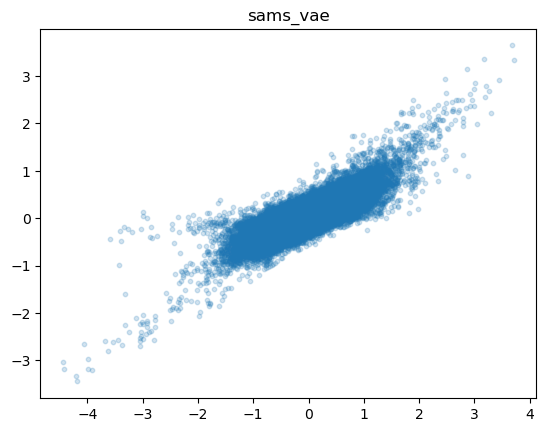

PearsonRResult(statistic=0.7469654697805014, pvalue=0.0)
0.5321510040355011


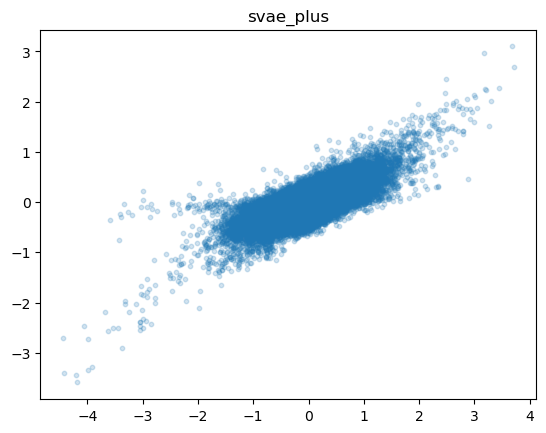

PearsonRResult(statistic=0.5973953331232869, pvalue=0.0)
0.3480601341912588


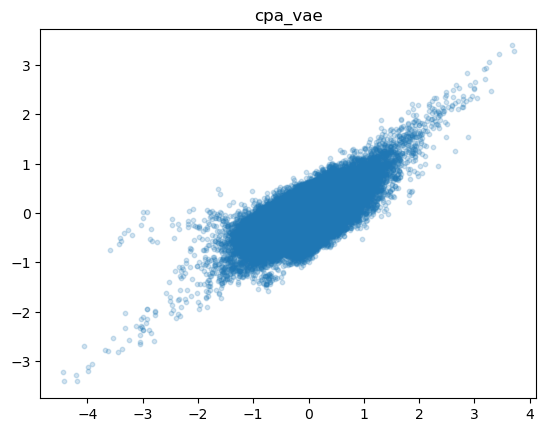

PearsonRResult(statistic=0.5507689354232189, pvalue=0.0)
0.20306988610696552


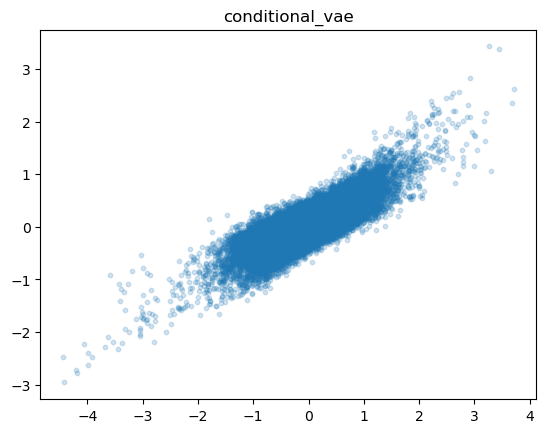

PearsonRResult(statistic=0.7495226585963314, pvalue=0.0)
0.5564498042739129


In [88]:
for model_key in model_ate_dict.keys():
    model_ate = model_ate_dict[model_key]

    data_ate, model_ate = align_adatas(data_ate, model_ate)
    
    plt.title(model_key)
    plt.scatter(data_ate.X.flatten(), model_ate.X.flatten(), s=10, alpha=0.2)
    plt.show(plt.gcf())
    
    print(pearsonr(data_ate.X.flatten(), model_ate.X.flatten()))
    print(r2_score(data_ate.X.flatten(), model_ate.X.flatten()))

We observe that the models that attempt to model explicit latent offsets (SAMS-VAE, CPA-VAE, and SVAE+) have a set of transcripts which are downregulated by perturbations in the data but for which the models do not capture this effect in the posterior predictive distribution.

Let's investigate what those perturbation / transcript pairs are.

In [100]:
for model_key in ["sams_vae", "cpa_vae", "svae_plus"]:
    print(model_key)
    print()
    model_ate = model_ate_dict[model_key]
    data_ate, model_ate = align_adatas(data_ate, model_ate)
    idx = (data_ate.X < -2.5) & (np.abs(model_ate.X) < 1)
    print(idx.sum())
    i_arr, j_arr = np.where(idx)
    for i, j in zip(i_arr, j_arr):
        print("Guide:", data_ate.obs.index[i])
        print("Transcript:", data_ate.var.iloc[j]["gene_name"])
    print()
    print()

sams_vae

15
Guide: RPS24_+_79793627.23-P1P2|RPS24_+_79793693.23-P1P2
Transcript: RPS24
Guide: NEDD8-MDP1_+_24701539.23-P1P2|NEDD8-MDP1_+_24701514.23-P1P2
Transcript: NEDD8
Guide: RPS5_+_58898640.23-P1P2|RPS5_-_58898655.23-P1P2
Transcript: RPS5
Guide: CCT5_+_10250403.23-P1P2|CCT5_+_10250415.23-P1P2
Transcript: CCT5
Guide: HSPE1_-_198365117.23-P1P2|HSPE1_+_198365089.23-P1P2
Transcript: HSPE1
Guide: RPL10A_-_35436407.23-P1P2|RPL10A_-_35436216.23-P1P2
Transcript: RPL10A
Guide: NEDD8_+_24701514.23-P1P2|NEDD8_+_24701539.23-P1P2
Transcript: NEDD8
Guide: RPS3_-_75110633.23-P1|RPS3_-_75110586.23-P1
Transcript: RPS3
Guide: RPS2_-_2014779.23-P1P2|RPS2_-_2014704.23-P1P2
Transcript: RPS2
Guide: RPS11_-_49999745.23-P1P2|RPS11_-_49999733.23-P1P2
Transcript: RPS11
Guide: RPS19_-_42364369.23-P1P2|RPS19_+_42364314.23-P1P2
Transcript: RPS19
Guide: RPL26_+_8286473.23-P1P2|RPL26_+_8286468.23-P1P2
Transcript: RPL26
Guide: TOMM20_-_235292152.23-P1P2|TOMM20_-_235292128.23-P1P2
Transcript: TOMM20
Guide: RPL14

We see that all of these "missed downregulation" occurrences correspond to transcripts that are directly targeted by the CRISPRi guides. These effects are sparse: they are specific to the one guide targeting the gene, rather than broader "pathway" effects shared across guides. It seems that the models that learn latent perturbation effect variables have difficulty encoding some of these effects that only show up in a single perturbation, whereas the conditional VAE, which directly has a one-hot encoding of perturbations, captures these effects.